#Principal component Analisis


In [103]:
import plotly.express as px
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score,classification_report, roc_curve, roc_auc_score
import seaborn as sns

from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler

from collections import Counter

In [104]:
df = pd.read_csv('phishing.csv')
features = df.loc[:,df.columns!='phishing'].columns.values
df = df.drop(df.columns[(df == 0).all()],axis=1)


In [105]:
df.fillna(0, inplace=True)
pca = PCA()
components = pca.fit_transform(df[features])

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(5)}
labels['color'] = 'phishing'

fig = px.scatter_matrix(
    components,
    color=df["phishing"],
    dimensions=range(5),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()




/Users/harlock/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [106]:
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)



Lineal Component Analysis

In [107]:
#Preprocess Data

dataset = df
# Divide the data set into features (X) and target variable (y)
X = dataset.iloc[:, 0:-2].values
y = dataset.iloc[:, -1].values

y_description=y
# Encode the target variable
#le = LabelEncoder()
#y = le.fit_transform(y)


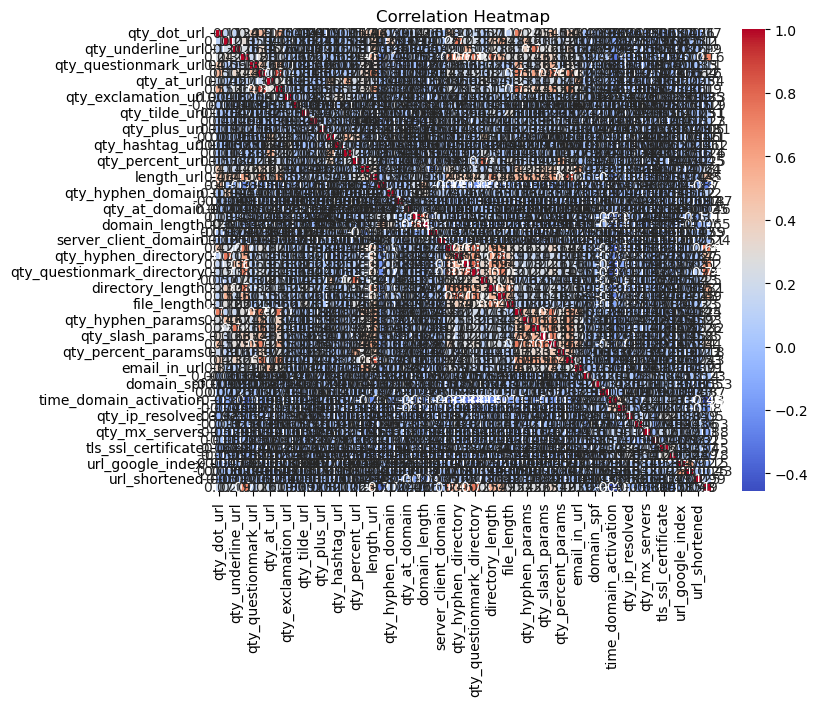

In [108]:
correlation_matrix = dataset.corr(numeric_only = True)
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


In [109]:
# Split the data set into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [110]:
# Apply Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis(n_components=1)
X_train = lda.fit_transform(X_train, y_train)
X_test = lda.transform(X_test)



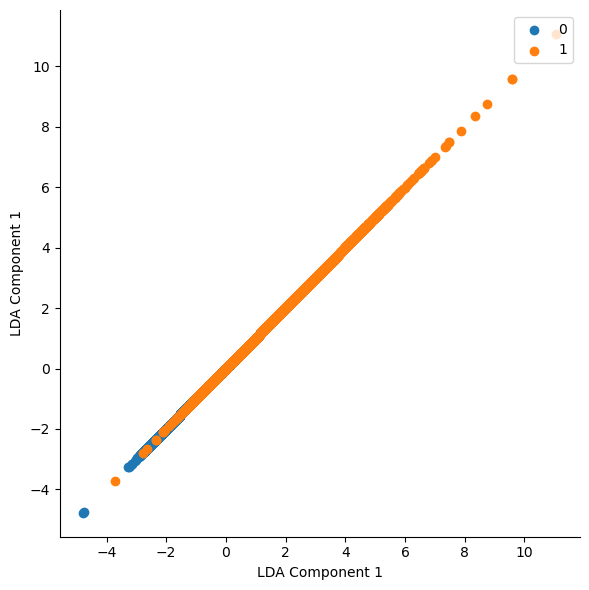

In [111]:
tmp_Df = pd.DataFrame(X_train, columns=['LDA Component 1'])
tmp_Df['Class']=y_train

sns.FacetGrid(tmp_Df, hue ="Class",
              height = 6).map(plt.scatter,
                              'LDA Component 1', 'LDA Component 1')

plt.legend(loc='upper right')



Indipendent Component Analysis 

In [112]:
data_numeric = df.select_dtypes(include=['number'])

In [113]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_numeric)
ica = FastICA(n_components=4, random_state=42, whiten='unit-variance')
ica.fit(data_scaled)
independent_components = ica.transform(data_scaled)

print("Primeras componentes independientes:")
print(independent_components[:, :4])

Primeras componentes independientes:
[[ 0.26776191  0.10379723 -0.80861101  0.30405251]
 [ 0.19349431  0.23229092 -0.91168876 -3.29761358]
 [-0.44624684  0.03064245 -0.38918803  0.36004902]
 ...
 [-0.24179259 -0.02329063 -1.62262911  0.38893224]
 [ 0.65021904  0.0713568  -0.5632806   0.37926444]
 [-0.00484568  0.10951763  0.67349158  0.16521048]]


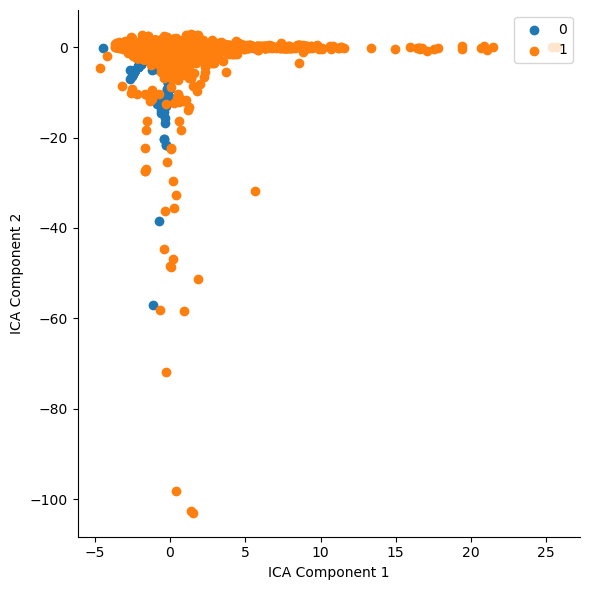

In [114]:
tmp_Df = pd.DataFrame(independent_components[:,0:2], columns=['ICA Component 1','ICA Component 2'])
tmp_Df['Class']=y

sns.FacetGrid(tmp_Df, hue ="Class",
              height = 6).map(plt.scatter,
                              'ICA Component 1',
                              'ICA Component 2')

plt.legend(loc='upper right')

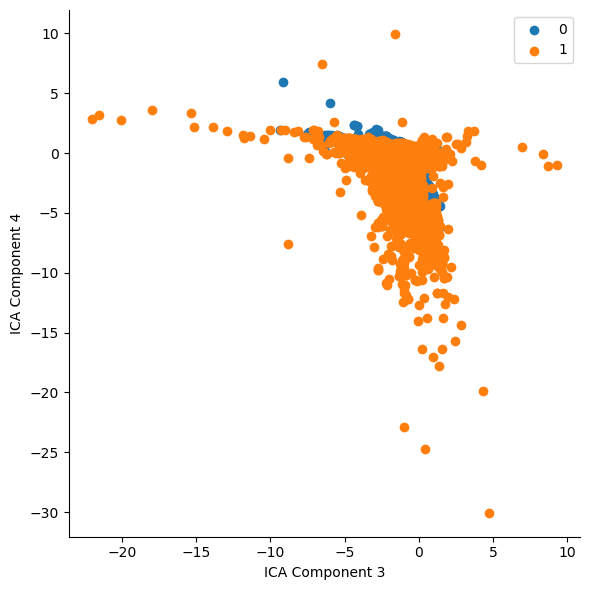

In [115]:
tmp_Df = pd.DataFrame(independent_components[:,2:4], columns=['ICA Component 3','ICA Component 4'])
tmp_Df['Class']=y

sns.FacetGrid(tmp_Df, hue ="Class",
              height = 6).map(plt.scatter,
                              'ICA Component 3',
                              'ICA Component 4')

plt.legend(loc='upper right')

#### test RandomForest LCA

In [57]:
classifier = RandomForestClassifier(max_depth=5, random_state=5)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)




Accuracy: 0.93
              precision    recall  f1-score   support

           0       0.94      0.95      0.94     11354
           1       0.91      0.88      0.89      6088

    accuracy                           0.93     17442
   macro avg       0.92      0.91      0.92     17442
weighted avg       0.93      0.93      0.93     17442



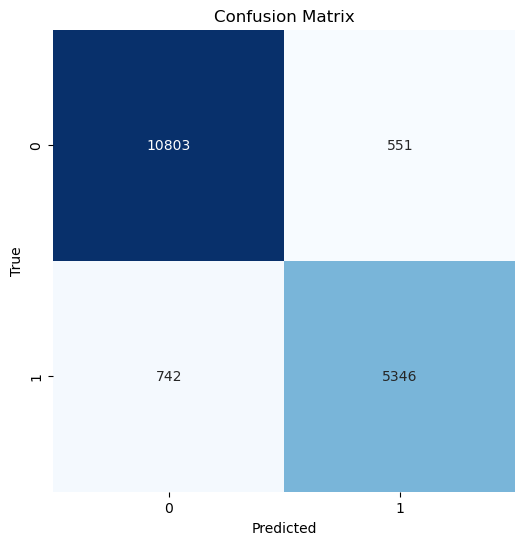

In [82]:
#Assume 'y_test' and 'y_pred' are already defined
accuracy = accuracy_score(y_test, y_pred)
conf_m = confusion_matrix(y_test, y_pred)



#Display the accuracy
print(f'Accuracy: {accuracy:.2f}')

print(classification_report(y_test, y_pred))

#Display the confusion matrix as a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(conf_m, annot=True, fmt="d", cmap="Blues", cbar=False, square=True)

plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

### ROC LCA

#### test RandomForest PCA

In [117]:
#Preprocess Data
tmp_Df_pca = pd.DataFrame(components[:,5:10], columns= {str(i): f"PC {i+1}" for i in range(5)})
tmp_Df_pca['Class']=y_description



# Divide the data set into features (X) and target variable (y)
X_pca = tmp_Df_pca.iloc[:, 0:5].values
y_pca = tmp_Df_pca.iloc[:, 5].values

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y_pca, test_size=0.2)



In [118]:
classifier_pca = RandomForestClassifier(max_depth=6, random_state=5)
classifier_pca.fit(X_train_pca, y_train_pca)
y_pred_pca = classifier_pca.predict(X_test_pca)



Accuracy: 0.88
              precision    recall  f1-score   support

           0       0.90      0.92      0.91     11333
           1       0.85      0.82      0.83      6109

    accuracy                           0.88     17442
   macro avg       0.88      0.87      0.87     17442
weighted avg       0.88      0.88      0.88     17442



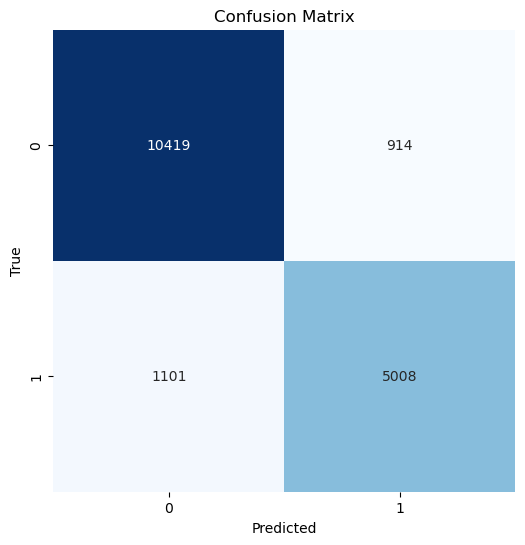

In [119]:
#Assume 'y_test' and 'y_pred' are already defined
accuracy_pca = accuracy_score(y_test_pca, y_pred_pca)
conf_m_pca = confusion_matrix(y_test_pca, y_pred_pca)

#Display the accuracy
print(f'Accuracy: {accuracy_pca:.2f}')

print(classification_report(y_test_pca, y_pred_pca))


#Display the confusion matrix as a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(conf_m_pca, annot=True, fmt="d", cmap="Blues", cbar=False, square=True)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

### test RandomForest ICA


In [64]:
#Preprocess Data
tmp_Df_ica = pd.DataFrame(independent_components[:, :4], columns= {str(i): f"PC {i+1}" for i in range(4)})
tmp_Df_ica['Class']=y_description


# Divide the data set into features (X) and target variable (y)
X_ica = tmp_Df_ica.iloc[:, 0:4].values
y_ica = tmp_Df_ica.iloc[:, 4].values

X_train_ica, X_test_ica, y_train_ica, y_test_ica = train_test_split(X_ica, y_ica, test_size=0.2)


In [65]:
classifier_ica = RandomForestClassifier(max_depth=6, random_state=5)
classifier_ica.fit(X_train_ica, y_train_ica)
y_pred_ica = classifier_ica.predict(X_test_ica)


Accuracy: 0.97
              precision    recall  f1-score   support

           0       0.98      0.97      0.98     11291
           1       0.94      0.97      0.96      6151

    accuracy                           0.97     17442
   macro avg       0.96      0.97      0.97     17442
weighted avg       0.97      0.97      0.97     17442



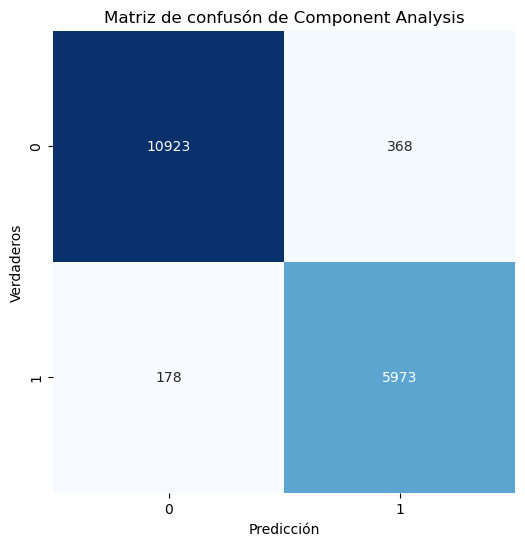

In [124]:
#Assume 'y_test' and 'y_pred' are already defined
accuracy_ica = accuracy_score(y_test_ica, y_pred_ica)
conf_m_ica = confusion_matrix(y_test_ica, y_pred_ica)

#Display the accuracy
print(f'Accuracy: {accuracy_ica:.2f}')
print(classification_report(y_test_ica, y_pred_ica))

#Display the confusion matrix as a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(conf_m_ica, annot=True, fmt="d", cmap="Blues", cbar=False, square=True)
plt.xlabel("Predicción")
plt.ylabel("Verdaderos")
plt.title("Matriz de confusón de Component Analysis")
plt.show()

### RANDOM FOREST ORIGINAL DATA

In [70]:
#Preprocess Data
dataset = df
# Divide the data set into features (X) and target variable (y)



# Divide the data set into features (X) and target variable (y)
X_ori = dataset.iloc[:, 0:-2].values
y_ori = dataset.iloc[:, -1].values

X_train_ori, X_test_ori, y_train_ori, y_test_ori = train_test_split(X_ori, y_ori, test_size=0.2)

In [71]:
classifier_ori = RandomForestClassifier(max_depth=6, random_state=5)
classifier_ori.fit(X_train_ori, y_train_ori)
y_pred_ori = classifier_ori.predict(X_test_ori)


Accuracy: 0.93
              precision    recall  f1-score   support

           0       0.96      0.93      0.95     11366
           1       0.88      0.93      0.90      6076

    accuracy                           0.93     17442
   macro avg       0.92      0.93      0.93     17442
weighted avg       0.93      0.93      0.93     17442



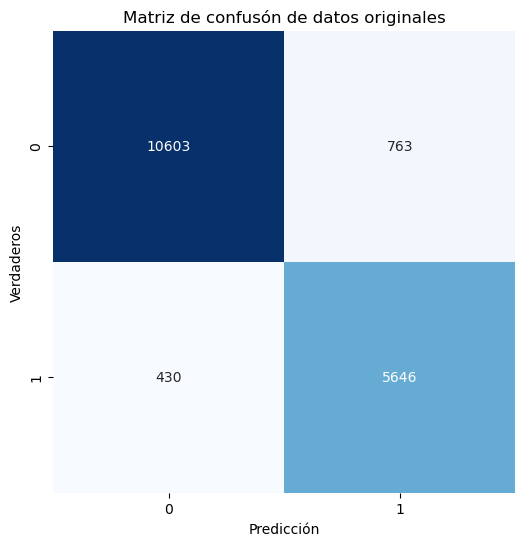

In [123]:
#Assume 'y_test' and 'y_pred' are already defined
accuracy_ori = accuracy_score(y_test_ori, y_pred_ori)
conf_m_ori = confusion_matrix(y_test_ori, y_pred_ori)

#Display the accuracy
print(f'Accuracy: {accuracy_ori:.2f}')

print(classification_report(y_test_ori, y_pred_ori))

#Display the confusion matrix as a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(conf_m_ori, annot=True, fmt="d", cmap="Blues", cbar=False, square=True)
plt.xlabel("Predicción")
plt.ylabel("Verdaderos")
plt.title("Matriz de confusón de datos originales")
plt.show()

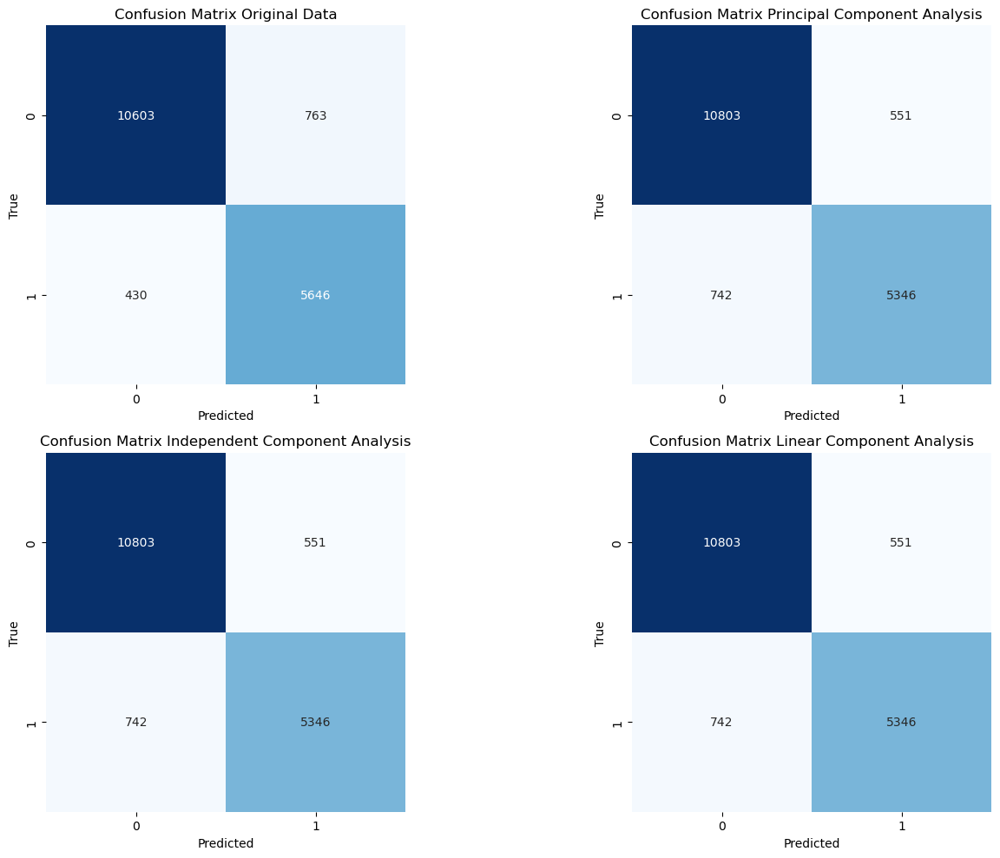

In [100]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,10))


ax=axes[0,0]
sns.heatmap(conf_m_ori, annot=True, fmt="d", cmap="Blues", cbar=False, square=True, ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix Original Data")

ax=axes[0,1]
sns.heatmap(conf_m, annot=True, fmt="d", cmap="Blues", cbar=False, square=True, ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix Principal Component Analysis")

ax=axes[1,0]
sns.heatmap(conf_m, annot=True, fmt="d", cmap="Blues", cbar=False, square=True, ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix Independent Component Analysis")

ax=axes[1,1]
sns.heatmap(conf_m, annot=True, fmt="d", cmap="Blues", cbar=False, square=True, ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix Linear Component Analysis")

plt.tight_layout()
plt.show()